# $E_{total}$ & $E_{total}/E_{0}$

In [1]:
%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML

from smbbh_nu import SMBBH_NU
from plot_process import Plot_Result

## 1. Parameters

In [2]:
black_hole_mass = [0.5, 0.5]  # m1(0.5), m2(0.5)
radius = 0.45  # 0.5
eccentricity = 0
constant_c = 0 
angles = [np.pi/6, np.pi/4, np.pi/6]  # omega, I, Omega

## 2. Potential

In [3]:
def potential_1(constant_c, tmp_array, ratio_mass, r):
    ratio_term = constant_c*(tmp_array*ratio_mass/r)
    first_term = 1/(r + r**3)
    second_term = np.arctan(r)/(r**2)
    V = ratio_term*(first_term - second_term)
    return V

## 3. Run

In [4]:
experiment_1 = SMBBH_NU(black_hole_mass,
                        # time_length=7*10**3,
                        # dt=5*(10**(-4)),
                        constant_c=constant_c,
                        radius=radius,
                        eccentricity=eccentricity,
                        angles=angles,
                        potential_function=potential_1)
result = experiment_1.run()

Begin Simulation of Supermassive Binary Black Holes : 
rk4 process done !
All Processes Done !


## 4. Plot

In [5]:
plot = Plot_Result(result_dict=result)

### 4-1. 3D Orbit

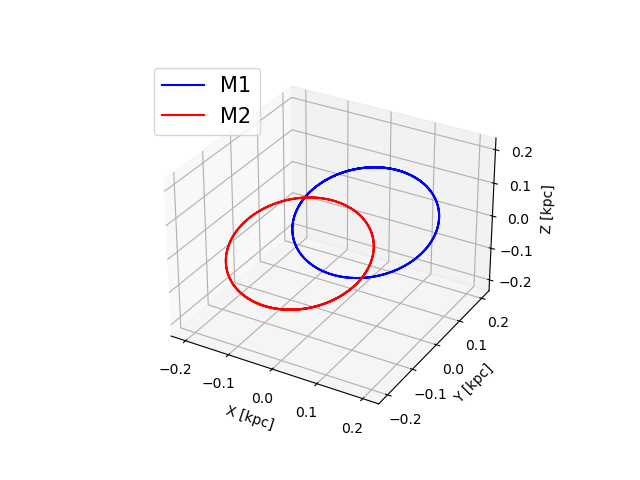

In [6]:
plot.plot_rk4_result(radius=radius)

### 4-2. $E_{total}$

$$E_{i} = \frac{1}{2}(u_{i}^{2} + v_{i}^{2} + w_{i}^{2}) - \frac{(m_{1} + m_{2})}{r_{i}} - c\frac{\arctan{(r_{i})}}{r_{i}} = \frac{1}{2}C_{J},$$ where $i = 1,2$.

$$E_{total} = E_{1} + E_{2}$$

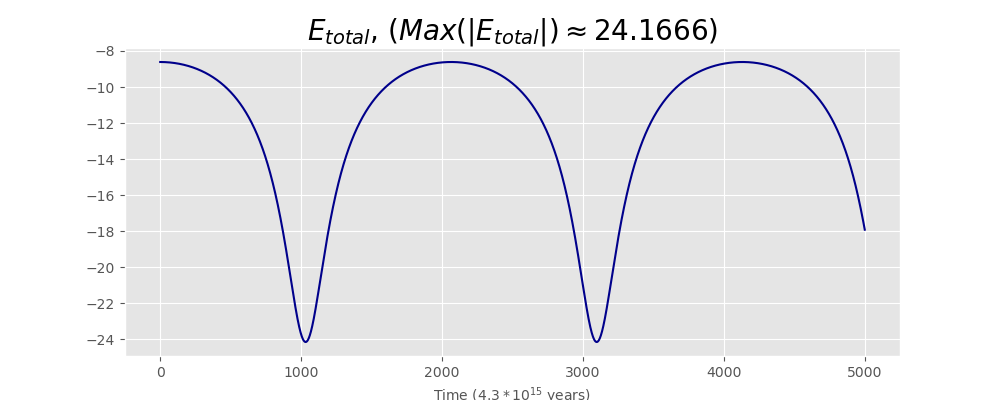

In [7]:
plot.plot_total_energy()

### 4-3. $E_{total}/E_{0}$

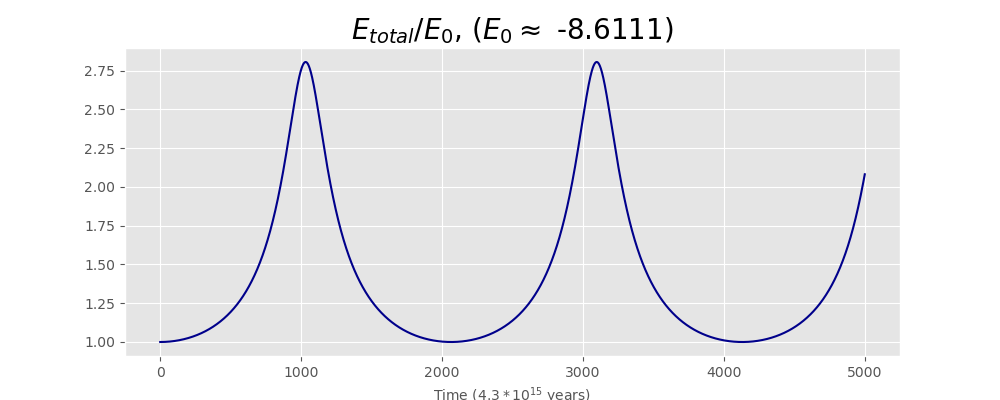

In [8]:
plot.plot_total_energy_divid_initE()

In [9]:
ani = plot.plot_orbit_video(radius=0.05, show_mode='html')
plt.close()
HTML(ani.to_jshtml(fps=10))